In [1]:
# Importing libraries
import numpy as np
import pandas as pd

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

# Disable Python warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load dataset
ok_df = pd.read_csv('okcupid_profiles.csv')
# Look Top & Last 5 rows of data
ok_df

,age,status,sex,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",...,about me: i would love to think that i was so...,currently working as an international agent fo...,making people laugh. ranting about a good salt...,"the way i look. i am a six foot half asian, ha...","books: absurdistan, the republic, of mice and ...",food. water. cell phone. shelter.,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet! you are ti...
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,...,i am a chef: this is what that means. 1. i am ...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories. my b...,NaN,NaN,i am very open and will share just about anyth...,NaN
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,...,"i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement conversation creation contemplation t...,NaN,viewing. listening. dancing. talking. drinking...,"when i was five years old, i was known as ""the...","you are bright, open, intense, silly, ironic, ..."
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,...,i work in a library and go to school. . .,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,"bataille, celine, beckett. . . lynch, jarmusch...",NaN,cats and german philosophy,NaN,NaN,you feel so inclined.
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",...,hey how's it going? currently vague on the pro...,work work work work + play,creating imagery to look at: http://bagsbrown....,i smile a lot and my inquisitive nature,"music: bands, rappers, musicians at the moment...",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59941,59,single,f,straight,NaN,NaN,socially,never,graduated from college/university,NaN,...,"vibrant, expressive, caring optimist. i love b...",the happiest times have been when life came to...,i make an outstanding osso bucco. i am also ve...,"i am told that people notice my smile, eyes an...",i am an avid movie watcher and follow the broa...,"my family, my dog, italy, words and music!",writing my book.,"running with my dog, finishing up the work wee...",i have a dream to sing at the alconquin in nyc...,you are seeking a long term connection of shar...
59942,24,single,m,straight,fit,mostly anything,often,sometimes,working on college/university,"white, other",...,i'm nick. i never know what to write about mys...,currently finishing school for film production...,"filmmaking, photography, graphic design, web d...","dude, i don't know.","movies: hook (the greatest adventure ever!), g...",iphone contact lenses headphones camera tv rem...,i do most of my thinking on the bus to/from wo...,"bringin' home bacon, or drinking and shakin'!",when i was 18 i got a tattoo of waldo somewher...,meh if you made it this far you might as well.
59943,42,single,m,straight,average,mostly anything,not at all,never,graduated from masters program,asian,...,"hello! i enjoy traveling, watching movies, and...","i'm a civil engineer, who enjoys helping the c...",- looking at things objectively - getting thin...,i'm quiet until i get used to the environment ...,"last book: ""game change"". movies

## I'm working on few stages to check the dataset

### 1. Data Cleaning

### 2. EDA

### 3. Data Preprocessing

### 4. Model building & Evaluation

## 1. Data Cleaning

In [3]:
# Statistical describe
ok_df.describe()

,age,height,income
count,59946.000000,59943.000000,59946.000000
mean,32.340290,68.295281,20033.222534
std,9.452779,3.994803,97346.192104
min,18.000000,1.000000,-1.000000
25%,26.000000,66.000000,-1.000000
50%,30.000000,68.000000,-1.000000
75%,37.000000,71.000000,-1.000000
max,110.000000,95.000000,1000000.000000


In [4]:
# Change rows where income is -1 to NA
ok_df.loc[ok_df['income'] == -1, 'income'] = np.nan

In [5]:
# Check data shape
ok_df.shape

(59946, 31)

In [6]:
# Check missing values
ok_df.isna().sum()

age                0
status             0
sex                0
orientation        0
body_type       5296
diet           24395
drinks          2985
drugs          14080
education       6628
ethnicity       5680
height             3
income         48442
job             8198
last_online        0
location           0
offspring      35561
pets           19921
religion       20226
sign           11056
smokes          5512
speaks            50
essay0          5488
essay1          7572
essay2          9638
essay3         11476
essay4         10537
essay5         10850
essay6         13771
essay7         12451
essay8         19225
essay9         12603
dtype: int64

In [7]:
# Missing columns
[col for col in ok_df.columns if ok_df[col].isnull().sum() > 0]

['body_type',
 'diet',
 'drinks',
 'drugs',
 'education',
 'ethnicity',
 'height',
 'income',
 'job',
 'offspring',
 'pets',
 'religion',
 'sign',
 'smokes',
 'speaks',
 'essay0',
 'essay1',
 'essay2',
 'essay3',
 'essay4',
 'essay5',
 'essay6',
 'essay7',
 'essay8',
 'essay9']

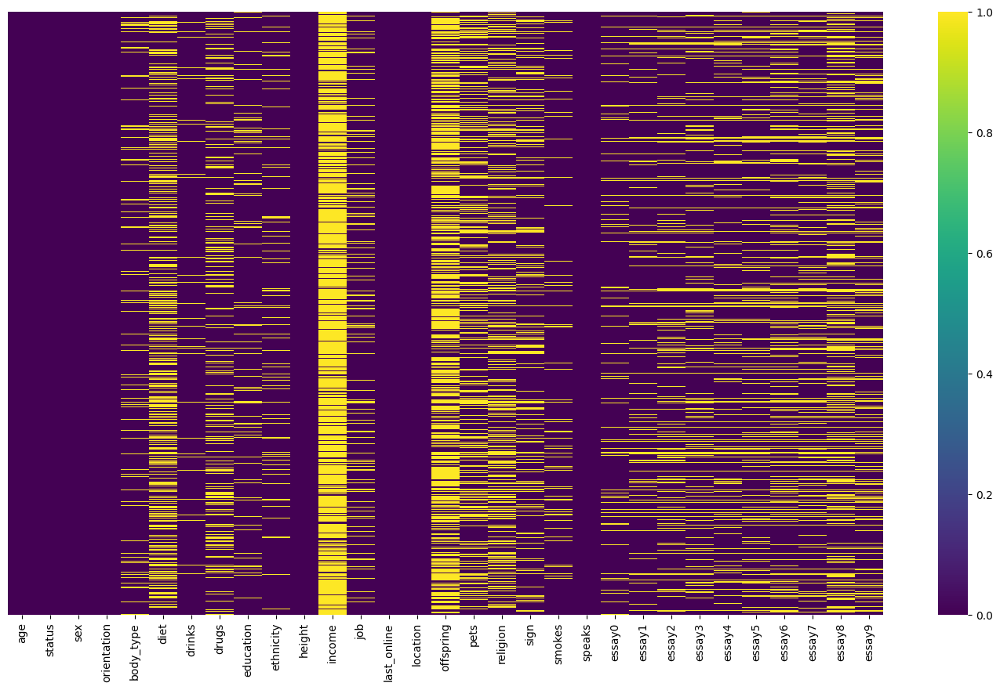

In [8]:
# Heatmap of missing cols
plt.figure(figsize=(18,10))
sns.heatmap(ok_df.isnull(), yticklabels=False,  cmap='viridis')
plt.show()

In [9]:
# Check duplicate values
ok_df.duplicated().sum()

0

In [10]:
# Check dtype of cols
ok_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59946 entries, 0 to 59945
Data columns (total 31 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          59946 non-null  int64  
 1   status       59946 non-null  object 
 2   sex          59946 non-null  object 
 3   orientation  59946 non-null  object 
 4   body_type    54650 non-null  object 
 5   diet         35551 non-null  object 
 6   drinks       56961 non-null  object 
 7   drugs        45866 non-null  object 
 8   education    53318 non-null  object 
 9   ethnicity    54266 non-null  object 
 10  height       59943 non-null  float64
 11  income       11504 non-null  float64
 12  job          51748 non-null  object 
 13  last_online  59946 non-null  object 
 14  location     59946 non-null  object 
 15  offspring    24385 non-null  object 
 16  pets         40025 non-null  object 
 17  religion     39720 non-null  object 
 18  sign         48890 non-null  object 
 19  smok

In [11]:
ok_df['essay0'][2]

"i'm not ashamed of much, but writing public text on an online dating site makes me pleasantly uncomfortable. i'll try to be as earnest as possible in the noble endeavor of standing naked before the world.  i've lived in san francisco for 15 years, and both love it and find myself frustrated with its deficits. lots of great friends and acquaintances (which increases my apprehension to put anything on this site), but i'm feeling like meeting some new people that aren't just friends of friends. it's okay if you are a friend of a friend too. chances are, if you make it through the complex filtering process of multiple choice questions, lifestyle statistics, photo scanning, and these indulgent blurbs of text without moving quickly on to another search result, you are probably already a cultural peer and at most 2 people removed. at first, i thought i should say as little as possible here to avoid you, but that seems silly.  as far as culture goes, i'm definitely more on the weird side of t

### Observation:

- 'essay0' : about me & about you detail.
- 'essay1' : currently working, in which company & what kind of work doing etc.
- 'essay2' : confidence level & finding detaill.
- 'essay3' : height size & looks detail.
- 'essay4' : books,movie,shows,music & food detail.
- 'essay5' : food,water,cell phone, & shelter detail.
- 'essay6' : duality and humorous things detail.
- 'essay7' : find someone to hang out with detail.
- 'essay8' : i am new to california and looking for someone detail.
- 'essay9' : you want to be swept off your feet! you are tired of the norm detail.

In [12]:
# Convert height inch into cm
ok_df['height'] = ok_df['height'].apply(lambda x: round(x * 2.54, 0))

In [13]:
# Find the average height of each gender
m_mean = round(ok_df.loc[ok_df['sex'] == 'm', 'height'].mean(), 0)
f_mean = round(ok_df.loc[ok_df['sex'] == 'f', 'height'].mean(), 0)

In [14]:
m_mean

179.0

In [15]:
f_mean

165.0

In [16]:
# NA values are replaced with the average height of men and women.
ok_df.loc[(ok_df['height'] <= 100) & (ok_df['sex']=='f'), 'height'] = f_mean
ok_df.loc[(ok_df['height'] <= 100) & (ok_df['sex']=='m'), 'height'] = m_mean

In [17]:
# Remove columns income,offspring,drinks,drugs,pets & essay0-to-essay9
ok_df.drop(columns=['income', 'offspring', 'drinks','drugs','pets','essay0','essay1','essay2','essay3','essay4','essay5','essay6','essay7','essay8','essay9'], axis=1, inplace=True)

In [18]:
# Add a disease and interest column randomly

lst_int = ["None", "Football (Soccer)", "Basketball", "American Football", "Rugby (Union)", "Rugby (League)", "Cricket", 
           "Ice Hockey", "Field Hockey", "Volleyball", "Handball", "Water Polo", "Athletics (Track and Field)", "Swimming", 
           "Gymnastics", "Tennis", "Golf", "Boxing", "Wrestling", "Martial Arts", "Cycling (Road)", "Cycling (Mountain)", 
           "Cycling (Track)", "Cycling (BMX)", "Archery", "Badminton", "Table Tennis", "Squash", "Mixed Martial Arts (MMA)", 
           "Judo", "Karate", "Taekwondo", "Diving", "Synchronized Swimming", "Rowing", "Canoeing", "Kayaking", "Sailing", 
           "Windsurfing", "Alpine Skiing", "Nordic Skiing", "Freestyle Skiing", "Snowboarding", "Figure Skating", 
           "Speed Skating", "Curling", "Bobsleigh", "Luge", "Skeleton", "Rock Climbing", "Surfing", "Skateboarding", 
           "Skydiving", "Base Jumping", "Whitewater Rafting", "Parkour", "Formula 1 Racing", "MotoGP", "Rally Racing",
           "NASCAR", "Karting", "Horse Racing", "Show Jumping", "Dressage", "Eventing", "Polo", "Archery", "Shooting (Rifle)",
           "Shooting (Pistol)", "Skeet Shooting", "Trap Shooting"]
lst_dis = ["None", "Diabetes", "Hypertension (High Blood Pressure)","Influenza (Flu)","Asthma","Arthritis",
           "Coronary Artery Disease","Stroke","Chronic Obstructive Pulmonary Disease (COPD)","Alzheimer's Disease",
           "Parkinson's Disease","Depression","Anxiety Disorders","Osteoporosis","Cancer (Various Types)","Heart Failure",
           "Chronic Kidney Disease","Gastroesophageal Reflux Disease (GERD)","Chronic Liver Disease","Migraine","Eczema",
           "Psoriasis","Multiple Sclerosis","Glaucoma","Rheumatoid Arthritis","Chronic Fatigue Syndrome",
           "Irritable Bowel Syndrome (IBS)","Bipolar Disorder","Schizophrenia","Chronic Bronchitis","Peptic Ulcer Disease",
           "Thyroid Disorders","Allergies","Anemia","Gout","Pneumonia","Urinary Tract Infection (UTI)",
           "Epilepsy","Hypothyroidism","Hyperthyroidism","Endometriosis","Polycystic Ovary Syndrome (PCOS)",
           "Hemorrhoids","Gastroenteritis","Tuberculosis (TB)","Cholecystitis (Gallbladder Inflammation)","Ovarian Cancer",
           "Prostate Cancer","Melanoma","Pancreatitis","Crohn's Disease","Ulcerative Colitis","Osteoarthritis",
           "Glomerulonephritis","Leukemia","Hepatitis","Meningitis","Cataracts","Retinal Diseases","Fibromyalgia",
           "Osteomyelitis","Atherosclerosis","Atrial Fibrillation","Deep Vein Thrombosis (DVT)","Pulmonary Embolism (PE)",
           "Hemorrhagic Stroke","Jaundice","Congestive Heart Failure","Obsessive-Compulsive Disorder (OCD)","Panic Disorder",
           "Sleep Apnea","Insomnia","Myocardial Infarction (Heart Attack)","Acne","Bipolar Disorder",
           "Hypertensive Heart Disease","Type 2 Diabetes","Temporomandibular Joint Disorder (TMJ)","Celiac Disease","Polio",
           "Measles","Chickenpox","Rubella (German Measles)","Pertussis (Whooping Cough)","Dengue Fever","Tuberculosis (TB)",
           "Malaria","Cholera","Zika Virus","Yellow Fever","Typhoid Fever","HIV/AIDS","Hepatitis B","Syphilis","Gonorrhea",
           "Chlamydia","Herpes","Human Papillomavirus (HPV)","Inflammatory Bowel Disease",
           "Systemic Lupus Erythematosus (Lupus)","E. coli Infection"]
ok_df['disease_1'] = np.random.choice(lst_dis, ok_df.shape[0])
ok_df['interest_1'] = np.random.choice(lst_int, ok_df.shape[0])

In [19]:
# Look random 3 rows of data
ok_df.sample(3)

,age,status,sex,orientation,body_type,diet,education,ethnicity,height,job,last_online,location,religion,sign,smokes,speaks,disease_1,interest_1
2294,49,single,m,straight,fit,NaN,NaN,asian,163.0,NaN,2011-12-27-10-02,"san francisco, california",NaN,NaN,NaN,english,Pertussis (Whooping Cough),Tennis
15452,19,single,m,straight,average,mostly anything,working on college/university,other,175.0,rather not say,2012-06-30-02-20,"moraga, california",NaN,aries and it&rsquo;s fun to think about,sometimes,english,Rheumatoid Arthritis,Dressage
48688,22,single,m,bisexual,average,strictly vegan,NaN,NaN,178.0,other,2012-06-29-22-15,"san francisco, california",atheism and laughing about it,sagittarius and it&rsquo;s fun to think about,no,english,None,Alpine Skiing


In [20]:
# Again Check null values
ok_df.isnull().sum()

age                0
status             0
sex                0
orientation        0
body_type       5296
diet           24395
education       6628
ethnicity       5680
height             3
job             8198
last_online        0
location           0
religion       20226
sign           11056
smokes          5512
speaks            50
disease_1          0
interest_1         0
dtype: int64

In [21]:
# Again Check duplicate values
ok_df.duplicated().sum()

0

In [22]:
# Again Check dtype of cols
ok_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59946 entries, 0 to 59945
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          59946 non-null  int64  
 1   status       59946 non-null  object 
 2   sex          59946 non-null  object 
 3   orientation  59946 non-null  object 
 4   body_type    54650 non-null  object 
 5   diet         35551 non-null  object 
 6   education    53318 non-null  object 
 7   ethnicity    54266 non-null  object 
 8   height       59943 non-null  float64
 9   job          51748 non-null  object 
 10  last_online  59946 non-null  object 
 11  location     59946 non-null  object 
 12  religion     39720 non-null  object 
 13  sign         48890 non-null  object 
 14  smokes       54434 non-null  object 
 15  speaks       59896 non-null  object 
 16  disease_1    59946 non-null  object 
 17  interest_1   59946 non-null  object 
dtypes: float64(1), int64(1), object(16)
memory usa

In [23]:
# Numerical cols
num_cols = [col for col in ok_df.columns if ok_df[col].dtype != 'O']
num_cols

['age', 'height']

In [24]:
# Categorical col
ct_cols = [col for col in ok_df.columns if ok_df[col].dtype == 'O']
ct_cols

['status',
 'sex',
 'orientation',
 'body_type',
 'diet',
 'education',
 'ethnicity',
 'job',
 'last_online',
 'location',
 'religion',
 'sign',
 'smokes',
 'speaks',
 'disease_1',
 'interest_1']

In [25]:
# ct_cols lenght
len(ct_cols)

16

## 2. EDA

In [26]:
# Statistical describe
ok_df.describe()

,age,height
count,59946.000000,59943.000000
mean,32.340290,173.496038
std,9.452779,9.898533
min,18.000000,107.000000
25%,26.000000,168.000000
50%,30.000000,173.000000
75%,37.000000,180.000000
max,110.000000,241.000000


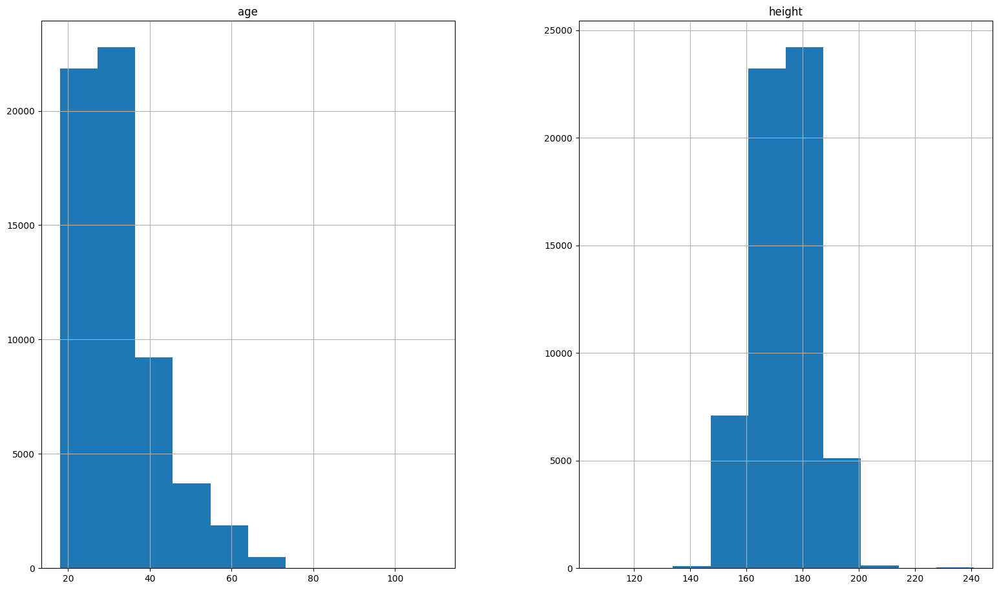

In [27]:
ok_df.hist(figsize=(19,11))
plt.show()

In [28]:
# Check skewness
ok_df[['age','height']].skew()

age       1.265773
height    0.038288
dtype: float64

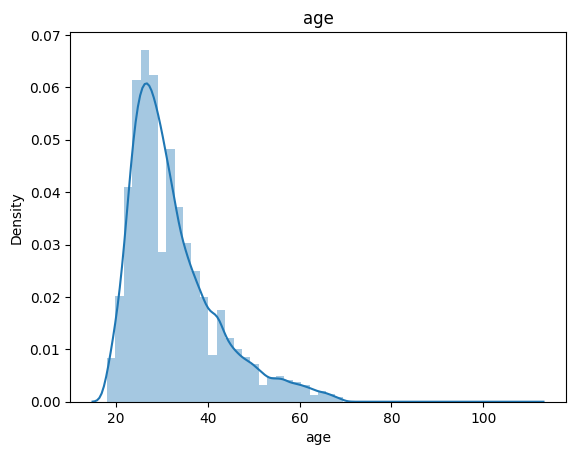

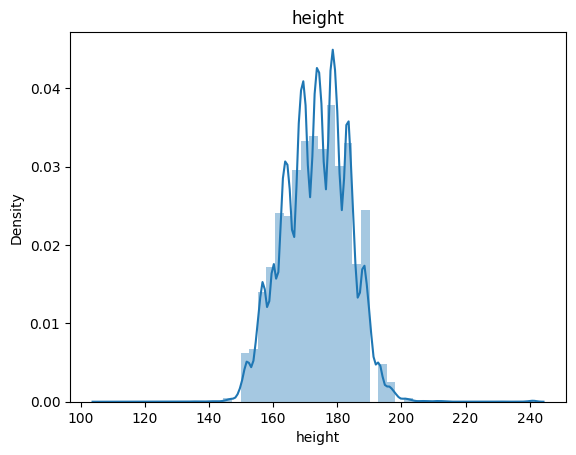

In [29]:
# Graph distplot of num_cols
for i in num_cols:
    sns.distplot(ok_df[i])
    plt.title(i)
    plt.show()

In [30]:
fig = px.box(ok_df, y=['age','height'])
fig.show()

In [31]:
# Remove outliers in age column
# Calculate IQR
q1 = ok_df['age'].quantile(0.25)
q3 = ok_df['age'].quantile(0.75)

IQR = q3 - q1

# Define the lower and upper bounds for outliers
lower_bound = q1 - 1.5 * IQR
upper_bound = q3 + 1.5 * IQR

# Remove outliers
ok_df = ok_df[(ok_df['age'] > lower_bound) & (ok_df['age'] < upper_bound)]

In [32]:
# Remove outliers in height column
# Calculate IQR
q1 = ok_df['height'].quantile(0.25)
q3 = ok_df['height'].quantile(0.75)

IQR = q3 - q1

# Define the lower and upper bounds for outliers
lower_bound = q1 - 1.5 * IQR
upper_bound = q3 + 1.5 * IQR

# Remove outliers
ok_df = ok_df[(ok_df['height'] > lower_bound) & (ok_df['height'] < upper_bound)]

In [33]:
ct_cols

['status',
 'sex',
 'orientation',
 'body_type',
 'diet',
 'education',
 'ethnicity',
 'job',
 'last_online',
 'location',
 'religion',
 'sign',
 'smokes',
 'speaks',
 'disease_1',
 'interest_1']

['single' 'available' 'seeing someone' 'married' 'unknown']
status
single            52640
seeing someone     2016
available          1775
married             284
unknown               9
Name: count, dtype: int64
status Length is :  5


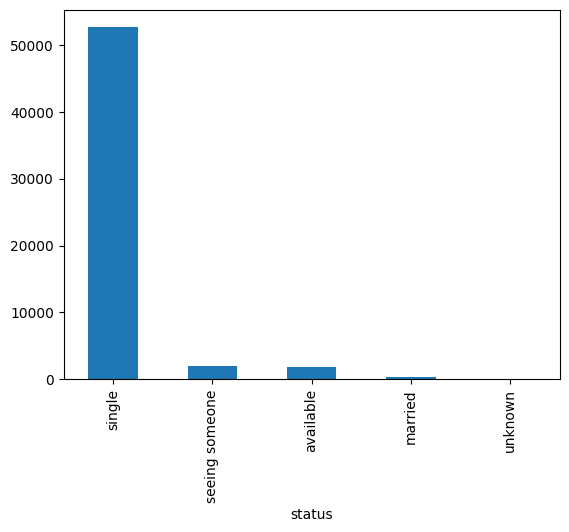

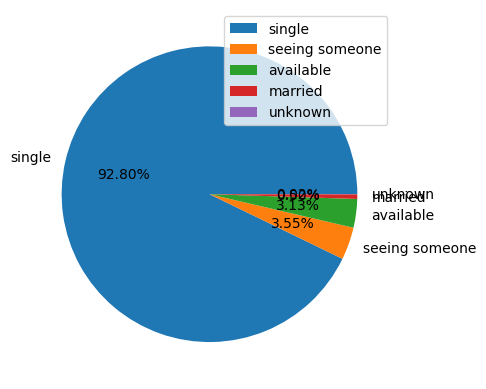

['m' 'f']
sex
m    34242
f    22482
Name: count, dtype: int64
sex Length is :  2


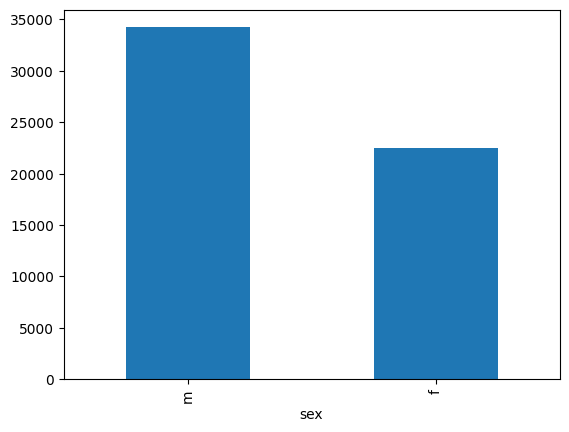

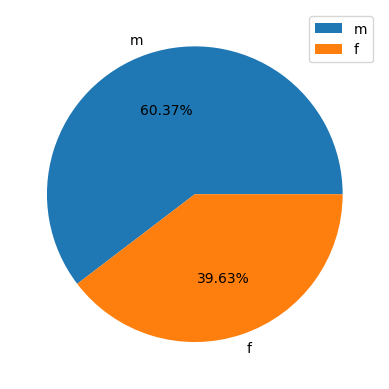

['straight' 'bisexual' 'gay']
orientation
straight    48698
gay          5344
bisexual     2682
Name: count, dtype: int64
orientation Length is :  3


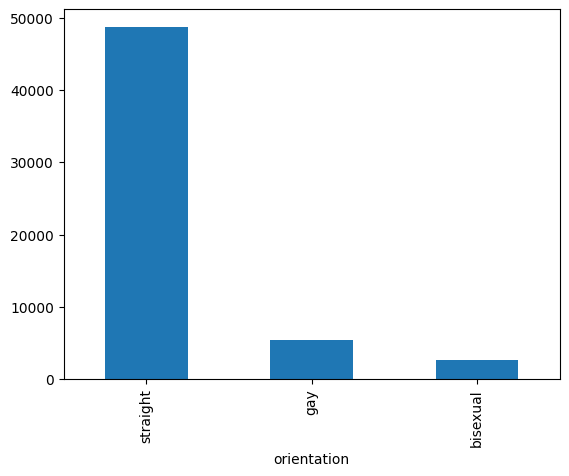

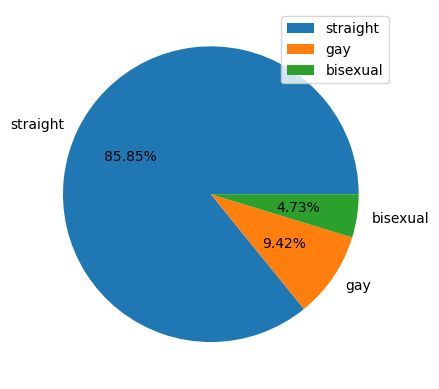

['a little extra' 'average' 'thin' 'athletic' 'fit' nan 'skinny' 'curvy'
 'full figured' 'jacked' 'rather not say' 'used up' 'overweight']
body_type
average           13725
fit               11968
athletic          11382
thin               4476
curvy              3695
a little extra     2368
skinny             1745
full figured        930
jacked              403
overweight          395
used up             332
rather not say      184
Name: count, dtype: int64
body_type Length is :  12


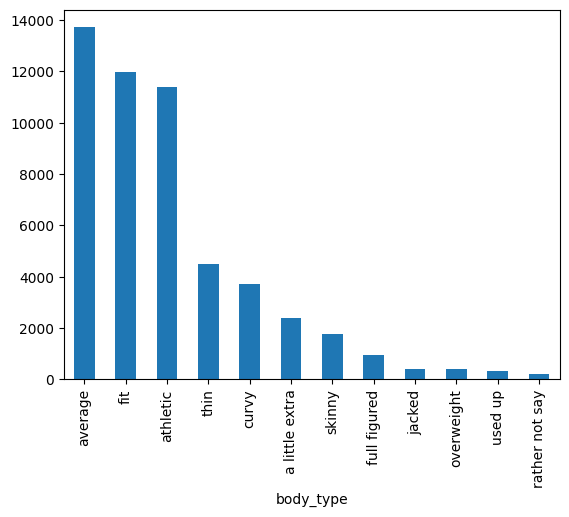

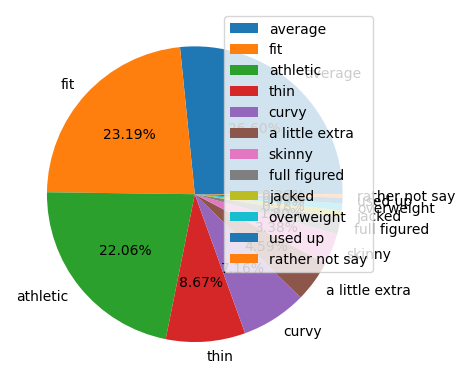

['sometimes' 'no' nan 'when drinking' 'yes' 'trying to quit']
smokes
no                41120
sometimes          3679
when drinking      2994
yes                2163
trying to quit     1419
Name: count, dtype: int64
smokes Length is :  5


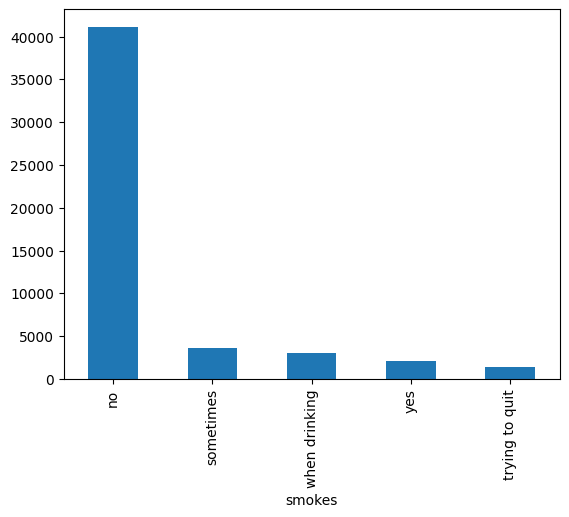

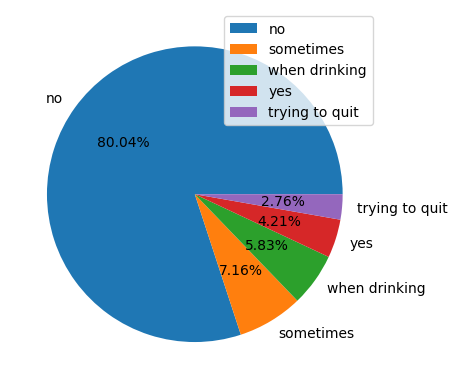

In [34]:
# Create a for loop to find the values in categorical cols

a = []
for i in ct_cols:
        len(ok_df[i].value_counts())
        
        if len(ok_df[i].value_counts()) < 15:
            print(ok_df[i].unique())
            print(ok_df[i].value_counts())
            
            print(i,'Length is : ',len(ok_df[i].value_counts()))
            ok_df[i].value_counts().plot(kind='bar')
            plt.show()
            
            label = ok_df[i].value_counts().index
            plt.pie(ok_df[i].value_counts(), labels=label, autopct='%.2f%%')
            plt.legend(loc=1)
            plt.show()
            
        else:
            a.append(i)
            

## 3. Data Preprocessing

In [35]:
# Remaining cols
a

['diet',
 'education',
 'ethnicity',
 'job',
 'last_online',
 'location',
 'religion',
 'sign',
 'speaks',
 'disease_1',
 'interest_1']

In [36]:
# Check uniques values
ok_df['status'].unique()

array(['single', 'available', 'seeing someone', 'married', 'unknown'],
      dtype=object)

In [37]:
# Replace unknown with NA 
ok_df.loc[ok_df['status'] == 'unknown', 'status'] = np.nan

In [38]:
ok_df['diet'].unique()

array(['strictly anything', 'mostly other', 'anything', 'vegetarian', nan,
       'mostly anything', 'mostly vegetarian', 'strictly vegan',
       'strictly vegetarian', 'mostly vegan', 'strictly other',
       'mostly halal', 'other', 'vegan', 'mostly kosher',
       'strictly halal', 'halal', 'strictly kosher', 'kosher'],
      dtype=object)

In [39]:
# Replace other with NA 
ok_df.loc[ok_df['diet'] == 'other', 'diet'] = np.nan

In [40]:
# Check null values
ok_df.isnull().sum()

age                0
status             9
sex                0
orientation        0
body_type       5121
diet           23326
education       6260
ethnicity       5464
height             0
job             7860
last_online        0
location           0
religion       19540
sign           10416
smokes          5349
speaks            45
disease_1          0
interest_1         0
dtype: int64

In [41]:
# Fill missing values all cols
ok_df['status'].fillna(ok_df['status'].mode()[0], inplace=True)
ok_df['body_type'].fillna(ok_df['body_type'].mode()[0], inplace=True)
ok_df['education'].fillna(ok_df['education'].mode()[0], inplace=True)
ok_df['height'].fillna(ok_df['height'].mode()[0], inplace=True)
ok_df['sign'].fillna(ok_df['sign'].mode()[0], inplace=True)
ok_df['smokes'].fillna(ok_df['smokes'].mode()[0], inplace=True)
ok_df['speaks'].fillna(ok_df['speaks'].mode()[0], inplace=True)

In [42]:
# Simplified categories by removing strictly and mostly
ok_df['diet'] = ok_df['diet'].str.replace('strictly ','')
ok_df['diet'] = ok_df['diet'].str.replace('mostly ','')

In [43]:
# Check uniques values
ok_df['diet'].unique()

array(['anything', 'other', 'vegetarian', nan, 'vegan', 'halal', 'kosher'],
      dtype=object)

In [44]:
# Replace other with NA 
ok_df.loc[ok_df['diet'] == 'other', 'diet'] = np.nan

In [45]:
# Fill missing values of diet
ok_df['diet'].fillna(ok_df['diet'].mode()[0], inplace=True)

In [46]:
# Mapping education values
edu_map = {'working on college/university' : 'university', 
               'working on space camp' : 'space camp',
               'unknown' : 'unknown', 
               'graduated from college/university' : 'university',
               'working on two-year college' : 'college', 
               'graduated from high school' : 'high school',
               'working on masters program' : 'masters degree', 
               'graduated from space camp' : 'space camp',
               'graduated from masters program' : 'masters degree', 
               'college/university' : 'university',
               'graduated from ph.d program' : 'ph.d', 
               'graduated from law school' : 'law school',
               'working on ph.d program' : 'ph.d', 
               'graduated from two-year college' : 'college',
               'dropped out of space camp' : 'space camp', 
               'working on med school' : 'med school',
               'dropped out of college/university' : 'university', 
               'two-year college' : 'college',
               'space camp' : 'space camp', 
               'dropped out of high school' : 'high school',
               'working on high school' : 'high school', 
               'masters program' : 'masters degree',
               'dropped out of ph.d program' : 'ph.d', 
               'dropped out of two-year college' : 'college',
               'dropped out of med school' : 'med school', 
               'high school' : 'high school',
               'graduated from med school' : 'med school', 
               'working on law school' : 'law school', 
               'law school' : 'law school',
               'dropped out of masters program' : 'masters degree', 
               'ph.d program' : 'ph.d',
               'dropped out of law school' : 'law school', 
               'med school' : 'med school', }

In [47]:
# Mapping to the dictionary
ok_df['education'] = [edu_map[c] for c in ok_df['education']]

In [48]:
# Unique vals
ok_df['education'].unique()

array(['university', 'space camp', 'masters degree', 'college',
       'high school', 'ph.d', 'law school', 'med school'], dtype=object)

In [49]:
ok_df['education'].mode()[0]

'university'

In [50]:
# Split data
ok_df['ethnicity'] = ok_df['ethnicity'].str.split(',').str[0]

In [51]:
# Check uniques values
ok_df['ethnicity'].unique()

array(['asian', 'white', nan, 'hispanic / latin', 'pacific islander',
       'black', 'middle eastern', 'native american', 'indian', 'other'],
      dtype=object)

In [52]:
# Replace other with NA
ok_df.loc[ok_df['ethnicity'] == 'other', 'ethnicity'] = np.nan

In [53]:
# Fill missing val of ethnicity
ok_df['ethnicity'].fillna(ok_df['ethnicity'].mode()[0], inplace=True)

In [54]:
# Replace missing values with other.
ok_df.loc[(ok_df['job']=='rather not say') | (ok_df['job']=='unemployed'), 'job'] = 'other'
# Split data
ok_df['job'] = ok_df['job'].str.split('/').str[0]

In [55]:
# Check uniques values
ok_df['job'].unique()

array(['transportation', 'hospitality ', nan, 'student', 'artistic ',
       'computer ', 'banking ', 'entertainment ', 'sales ', 'other',
       'medicine ', 'science ', 'executive ', 'education ', 'clerical ',
       'construction ', 'political ', 'law ', 'military', 'retired'],
      dtype=object)

In [56]:
# Replcae with NA
ok_df.loc[ok_df['job'] == 'other', 'job'] = np.nan

In [57]:
# Fill missing value
ok_df['job'].fillna(ok_df['job'].mode()[0], inplace=True)

In [58]:
# Split data
ok_df['location'] = ok_df['location'].str.split(', ').str[1]

In [59]:
# Check uniques values
ok_df['location'].unique()

array(['california', 'colorado', 'new york', 'oregon', 'arizona',
       'hawaii', 'montana', 'wisconsin', 'virginia', 'spain', 'illinois',
       'vietnam', 'ireland', 'louisiana', 'michigan', 'texas',
       'united kingdom', 'massachusetts', 'north carolina', 'idaho',
       'mississippi', 'new jersey', 'florida', 'minnesota', 'georgia',
       'utah', 'west virginia', 'connecticut', 'tennessee',
       'rhode island', 'district of columbia', 'british columbia',
       'missouri', 'pennsylvania', 'netherlands', 'switzerland', 'ohio',
       'washington'], dtype=object)

In [60]:
# Split data
ok_df['religion'] = ok_df['religion'].str.split(' ').str[0]

In [61]:
# Check uniques values
ok_df['religion'].unique()

array(['agnosticism', nan, 'atheism', 'christianity', 'other',
       'catholicism', 'buddhism', 'judaism', 'hinduism', 'islam'],
      dtype=object)

In [62]:
# Replace other with NA 
ok_df.loc[ok_df['religion'] == 'other', 'religion'] = np.nan

In [63]:
# Fill missing value of religion
ok_df['religion'].fillna(ok_df['religion'].mode()[0], inplace=True)

In [64]:
# Split data
ok_df['sign'] = ok_df['sign'].str.split(' ').str[0]

In [65]:
# Check uniques values
ok_df['sign'].unique()

array(['gemini', 'cancer', 'pisces', 'aquarius', 'taurus', 'virgo',
       'sagittarius', 'leo', 'aries', 'libra', 'scorpio', 'capricorn'],
      dtype=object)

In [66]:
# Split data
ok_df['speaks'] = ok_df['speaks'].str.split(' ').str[0]
ok_df['speaks'] = ok_df['speaks'].str.replace(',','')

In [67]:
# Check uniques values
ok_df['speaks'].unique()

array(['english', 'afrikaans', 'french', 'portuguese'], dtype=object)

In [68]:
# Check uniques values
ok_df['last_online'].unique()

array(['2012-06-28-20-30', '2012-06-29-21-41', '2012-06-27-09-10', ...,
       '2012-06-02-08-16', '2012-02-17-20-44', '2012-06-14-16-51'],
      dtype=object)

In [69]:
# Split data
ok_df['last_online'] = ok_df['last_online'].str[0:7]

['anything' 'vegetarian' 'vegan' 'halal' 'kosher']
diet
anything      51222
vegetarian     4644
vegan           674
kosher          110
halal            74
Name: count, dtype: int64
diet Length is :  5


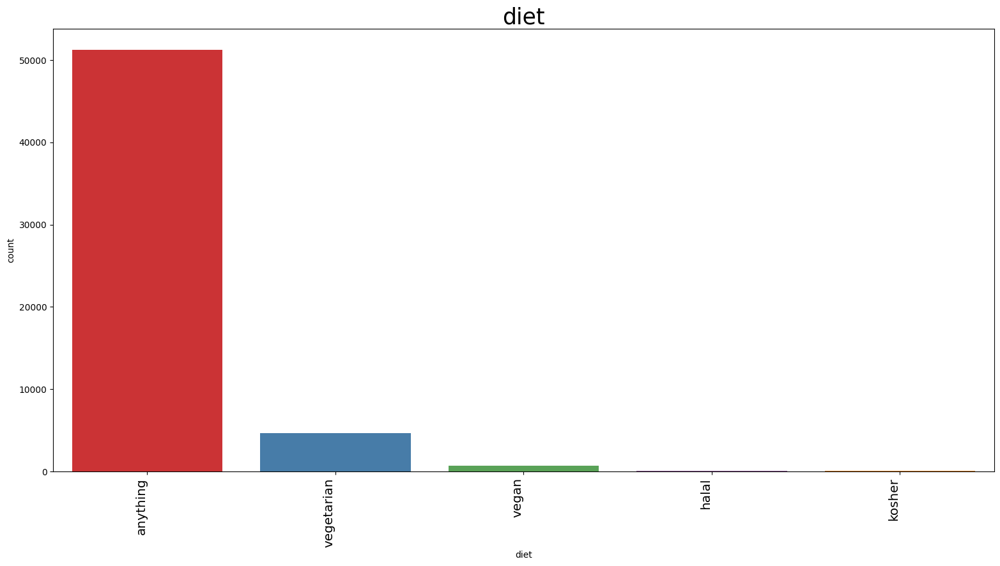

['university' 'space camp' 'masters degree' 'college' 'high school' 'ph.d'
 'law school' 'med school']
education
university        36416
masters degree    10148
college            2781
ph.d               2224
space camp         1597
high school        1583
law school         1327
med school          648
Name: count, dtype: int64
education Length is :  8


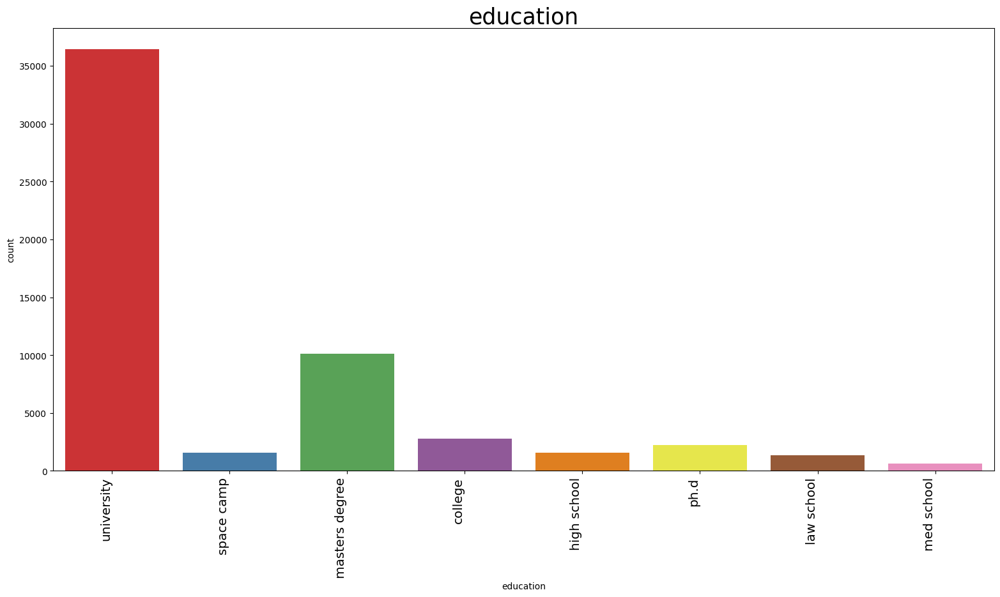

['asian' 'white' 'hispanic / latin' 'pacific islander' 'black'
 'middle eastern' 'native american' 'indian']
ethnicity
white               38184
asian                7997
hispanic / latin     4248
black                2951
indian               1183
middle eastern        788
pacific islander      700
native american       673
Name: count, dtype: int64
ethnicity Length is :  8


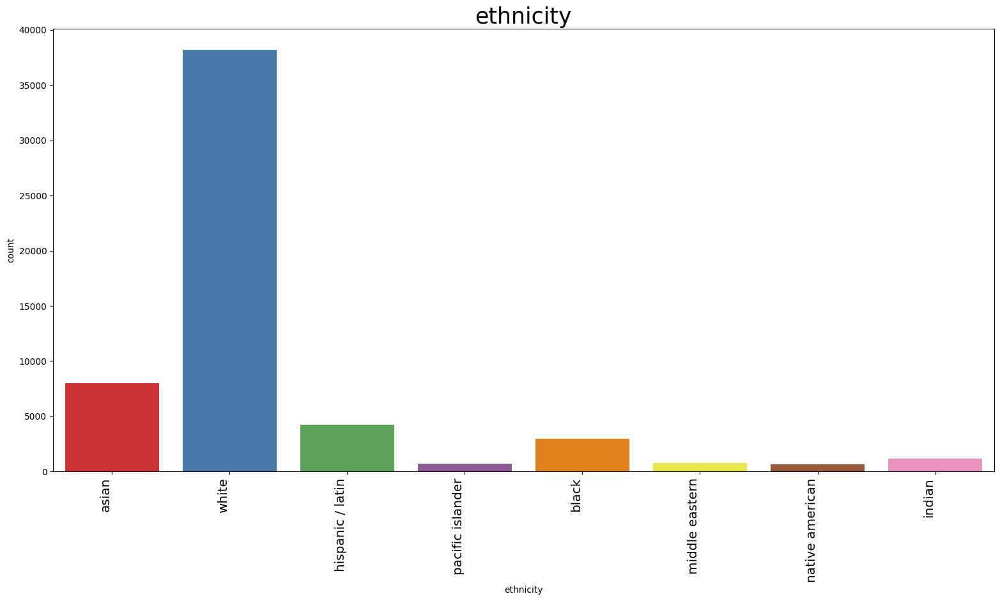

['transportation' 'hospitality ' 'student' 'artistic ' 'computer '
 'banking ' 'entertainment ' 'sales ' 'medicine ' 'science ' 'executive '
 'education ' 'clerical ' 'construction ' 'political ' 'law ' 'military'
 'retired']
job
student           20422
science            4699
computer           4565
sales              4204
artistic           4118
medicine           3346
education          3254
executive          2197
entertainment      2176
banking            2165
hospitality        1319
law                1292
construction        932
clerical            750
political           651
transportation      332
military            198
retired             104
Name: count, dtype: int64
job Length is :  18


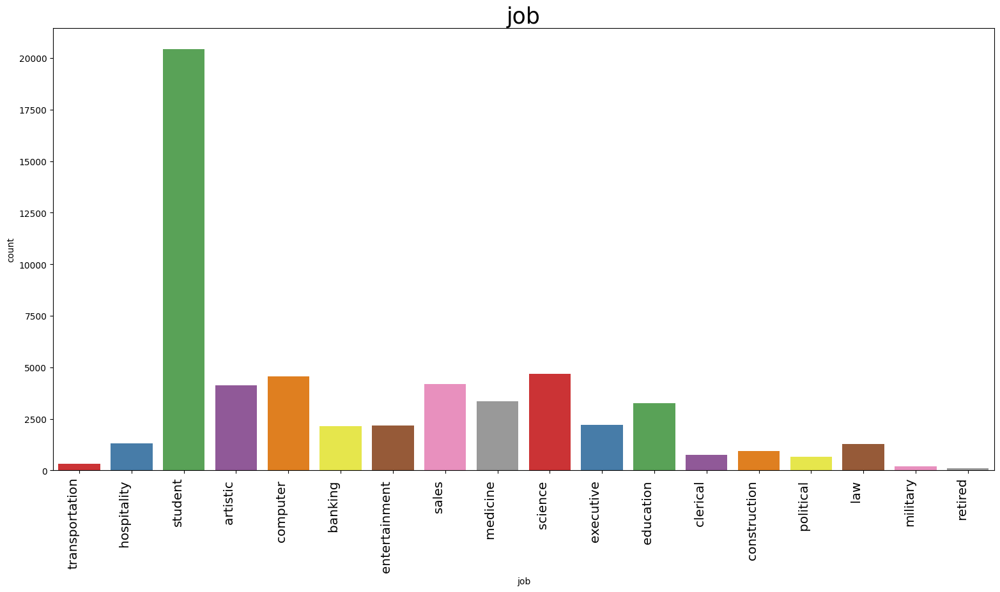

['2012-06' '2012-05' '2011-11' '2012-03' '2011-10' '2012-04' '2012-02'
 '2011-12' '2012-01' '2011-07' '2011-09' '2011-08' '2011-06' '2012-07']
last_online
2012-06    40167
2012-05     3576
2012-04     2360
2012-07     1996
2012-03     1774
2012-02     1255
2012-01     1170
2011-12      908
2011-11      808
2011-10      762
2011-09      665
2011-08      607
2011-07      594
2011-06       82
Name: count, dtype: int64
last_online Length is :  14


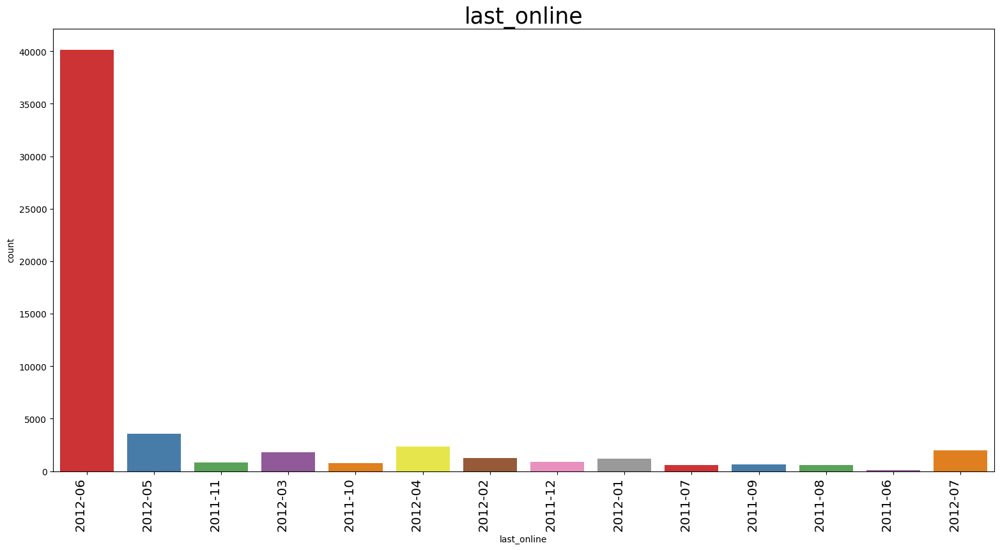

['california' 'colorado' 'new york' 'oregon' 'arizona' 'hawaii' 'montana'
 'wisconsin' 'virginia' 'spain' 'illinois' 'vietnam' 'ireland' 'louisiana'
 'michigan' 'texas' 'united kingdom' 'massachusetts' 'north carolina'
 'idaho' 'mississippi' 'new jersey' 'florida' 'minnesota' 'georgia' 'utah'
 'west virginia' 'connecticut' 'tennessee' 'rhode island'
 'district of columbia' 'british columbia' 'missouri' 'pennsylvania'
 'netherlands' 'switzerland' 'ohio' 'washington']
location
california              56637
new york                   17
illinois                    8
massachusetts               5
oregon                      4
texas                       4
michigan                    4
arizona                     3
florida                     3
united kingdom              2
minnesota                   2
georgia                     2
district of columbia        2
spain                       2
virginia                    2
utah                        2
ohio                        2
hawaii    

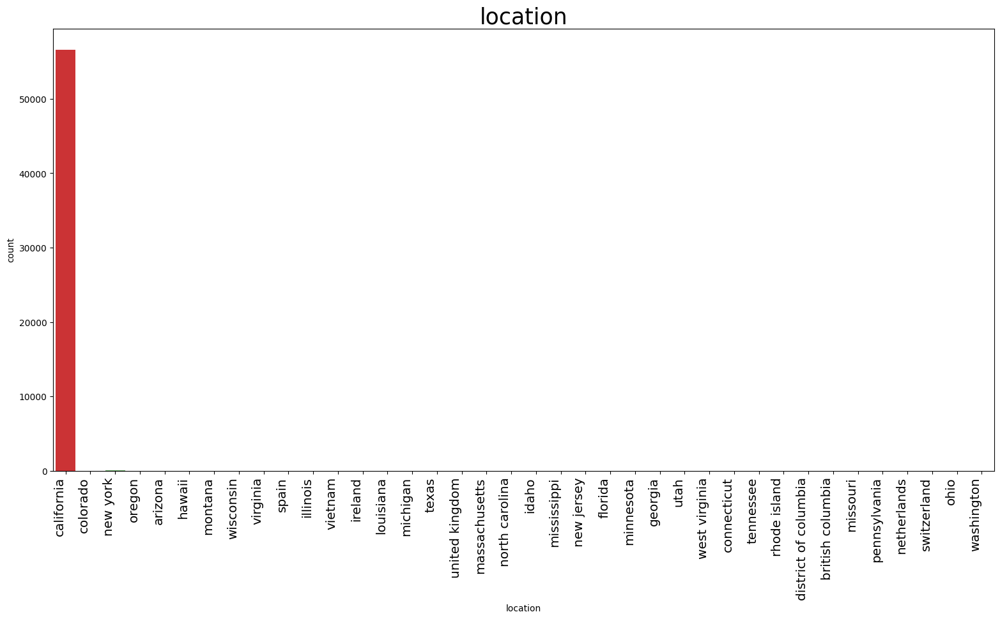

['agnosticism' 'atheism' 'christianity' 'catholicism' 'buddhism' 'judaism'
 'hinduism' 'islam']
religion
agnosticism     34969
atheism          6762
christianity     5370
catholicism      4525
judaism          2774
buddhism         1749
hinduism          441
islam             134
Name: count, dtype: int64
religion Length is :  8


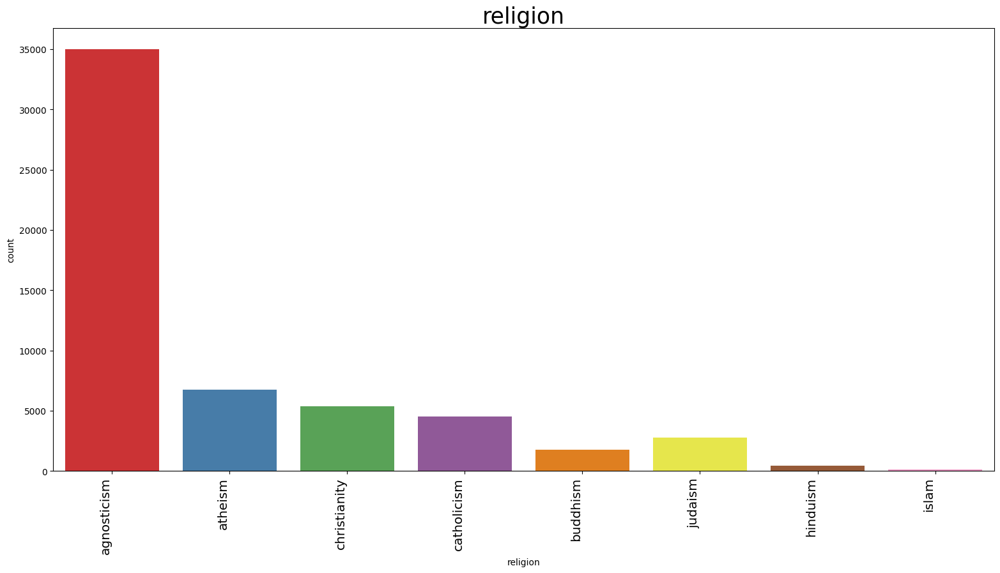

['gemini' 'cancer' 'pisces' 'aquarius' 'taurus' 'virgo' 'sagittarius'
 'leo' 'aries' 'libra' 'scorpio' 'capricorn']
sign
gemini         14497
leo             4156
libra           3986
cancer          3985
virgo           3934
scorpio         3921
taurus          3904
aries           3763
sagittarius     3740
pisces          3733
aquarius        3710
capricorn       3395
Name: count, dtype: int64
sign Length is :  12


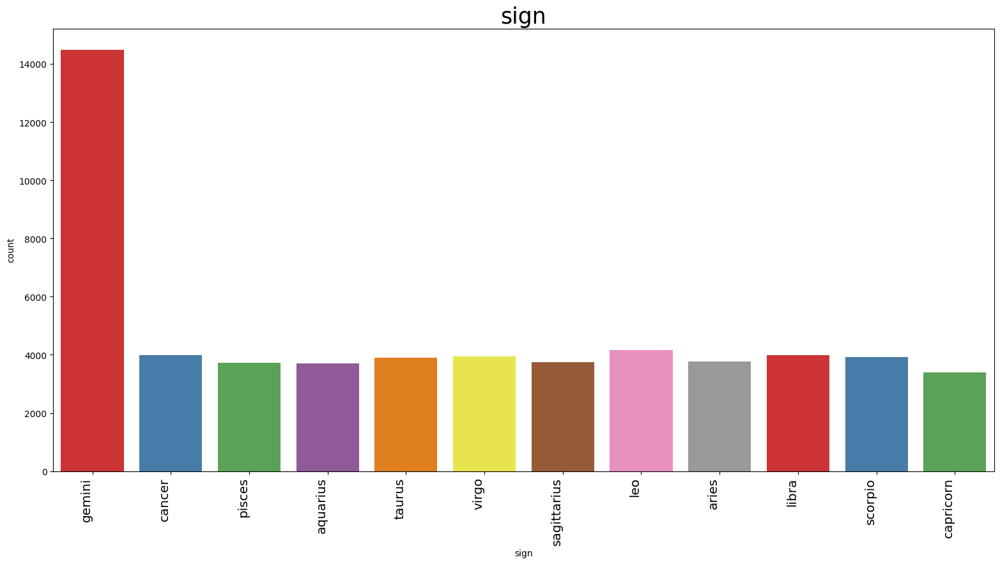

['english' 'afrikaans' 'french' 'portuguese']
speaks
english       56720
french            2
afrikaans         1
portuguese        1
Name: count, dtype: int64
speaks Length is :  4


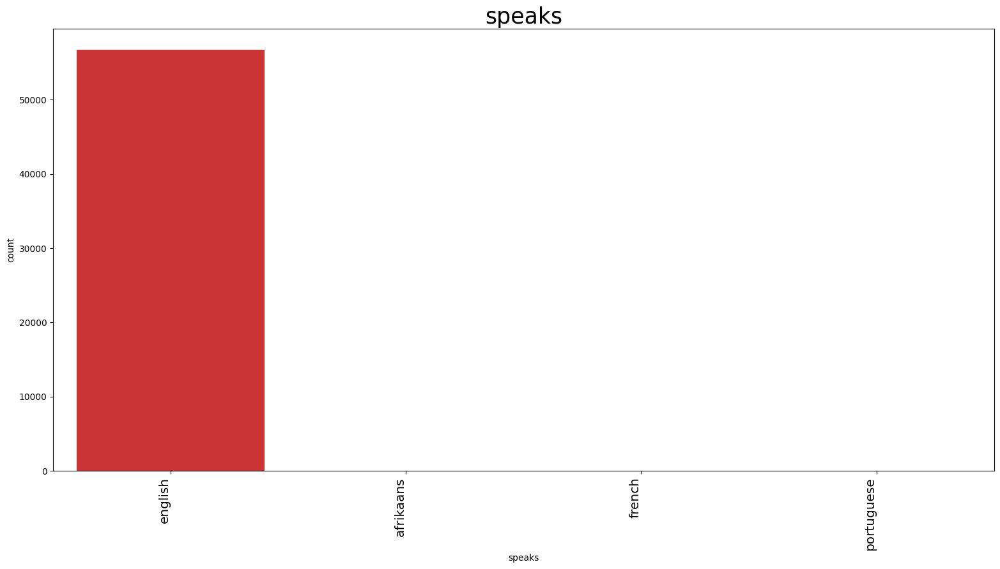

['Stroke' 'Celiac Disease' 'Diabetes' 'Human Papillomavirus (HPV)'
 'Atherosclerosis' 'None' 'Yellow Fever' 'Congestive Heart Failure'
 'Osteoporosis' 'Schizophrenia' 'Herpes' 'Influenza (Flu)'
 'Polycystic Ovary Syndrome (PCOS)' 'Rheumatoid Arthritis' 'Dengue Fever'
 'Thyroid Disorders' 'Tuberculosis (TB)' 'Glomerulonephritis'
 'Myocardial Infarction (Heart Attack)' "Parkinson's Disease" 'Hepatitis'
 'Polio' "Crohn's Disease" 'Anemia' 'Hemorrhoids' 'Endometriosis'
 'E. coli Infection' 'Multiple Sclerosis' "Alzheimer's Disease"
 'Fibromyalgia' 'Melanoma' 'Asthma' 'Chronic Liver Disease'
 'Temporomandibular Joint Disorder (TMJ)' 'Gastroenteritis'
 'Pulmonary Embolism (PE)' 'Meningitis'
 'Hypertension (High Blood Pressure)' 'Psoriasis' 'Typhoid Fever'
 'Panic Disorder' 'Heart Failure' 'Hypertensive Heart Disease' 'Leukemia'
 'Epilepsy' 'Acne' 'Atrial Fibrillation' 'Syphilis' 'Osteomyelitis'
 'Measles' 'Gonorrhea' 'Glaucoma' 'Type 2 Diabetes' 'Eczema'
 'Retinal Diseases' 'Chronic Kidney D

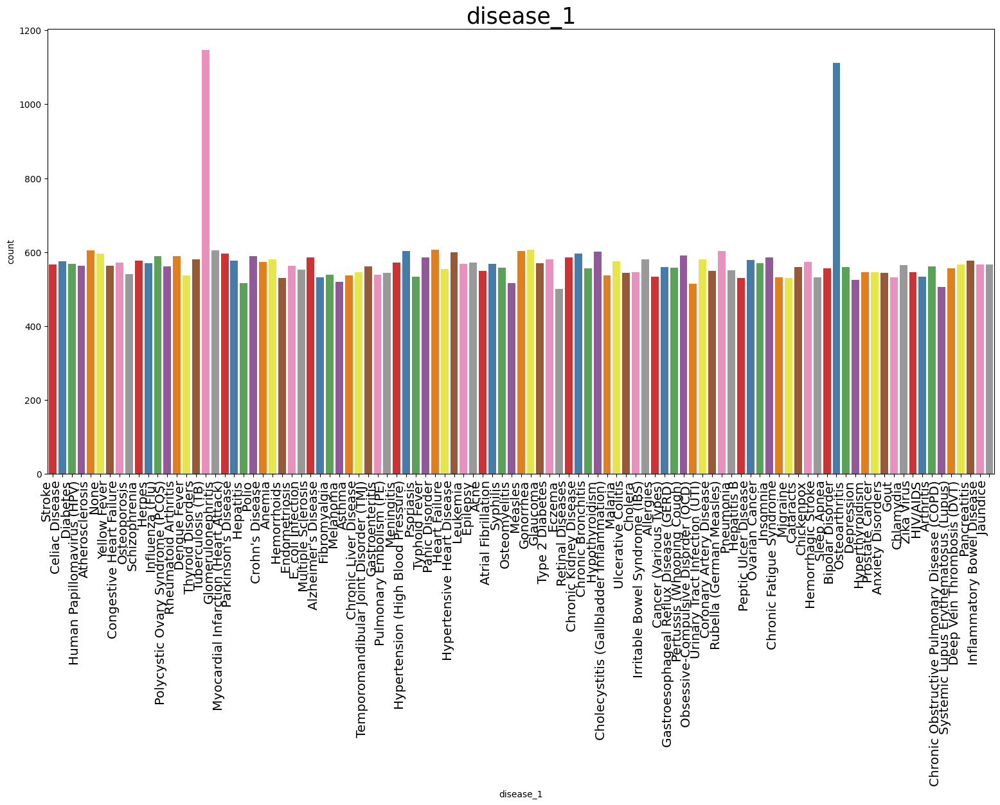

['Table Tennis' 'Rugby (League)' 'Sailing' 'Freestyle Skiing' 'Swimming'
 'Base Jumping' 'None' 'Canoeing' 'Badminton' 'Polo' 'Diving'
 'Athletics (Track and Field)' 'Boxing' 'Judo' 'Mixed Martial Arts (MMA)'
 'Skateboarding' 'Snowboarding' 'MotoGP' 'Curling' 'Dressage'
 'Shooting (Pistol)' 'Formula 1 Racing' 'Field Hockey' 'Surfing' 'NASCAR'
 'Ice Hockey' 'Basketball' 'Cycling (Road)' 'Cricket'
 'Synchronized Swimming' 'Cycling (BMX)' 'Skeet Shooting' 'Wrestling'
 'Rally Racing' 'Gymnastics' 'Volleyball' 'Bobsleigh' 'Speed Skating'
 'Nordic Skiing' 'Golf' 'Eventing' 'Skydiving' 'Taekwondo' 'Water Polo'
 'Alpine Skiing' 'Handball' 'Show Jumping' 'Kayaking' 'Football (Soccer)'
 'Cycling (Track)' 'Whitewater Rafting' 'Trap Shooting' 'Rock Climbing'
 'Cycling (Mountain)' 'Squash' 'Martial Arts' 'Windsurfing'
 'Figure Skating' 'Horse Racing' 'Shooting (Rifle)' 'Karate' 'Tennis'
 'Parkour' 'Archery' 'Luge' 'Rugby (Union)' 'Skeleton' 'Karting' 'Rowing'
 'American Football']
interest_1
Archer

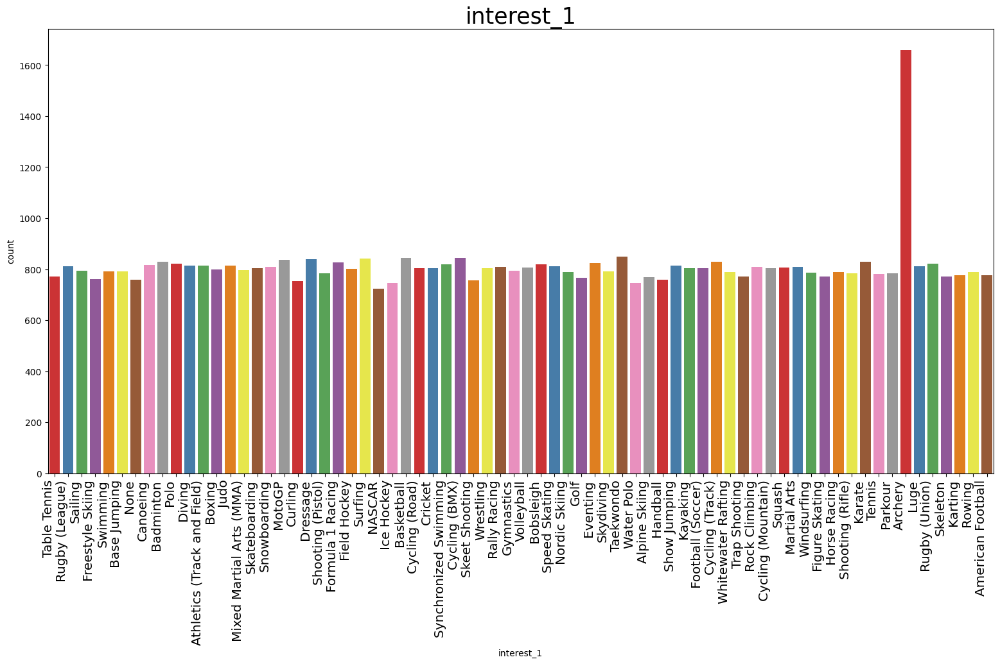

In [70]:
# Create a for loop to find the values in categorical cols

b = []
for i in a:
        len(ok_df[i].value_counts())

        
        if len(ok_df[i].value_counts()) < 100:
            print(ok_df[i].unique())
            print(ok_df[i].value_counts())     
            print(i,'Length is : ',len(ok_df[i].value_counts()))

            plt.figure(figsize=(19,9))
            chart = sns.countplot(data=ok_df, x=ok_df[i], palette='Set1')
            chart.set_xticklabels(
            chart.get_xticklabels(), 
            rotation=90, 
            horizontalalignment='right',
            fontweight='light',
            fontsize='x-large')   
            chart.set_title(i, fontdict={'size': 25})
            plt.show()
            
            
        else:
            b.append(i)

In [71]:
# All categorical columns has solved.
b

[]

## 4. Model build

In [72]:
# importing scikit learn library
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import NearestNeighbors

In [73]:
# Visualize Pipeline
from sklearn import set_config

set_config(display="diagram")

In [74]:
# Use ColumnTransformer to convert categorical cols into numerical form
cat_cols = ['disease_1', 'interest_1','disease_2', 'interest_2','disease_3', 'interest_3']

trf1 = ColumnTransformer(
    transformers=[
        ('oh_encoding', OneHotEncoder(sparse=False, handle_unknown='ignore', drop='first', dtype='int'), cat_cols)
    ],
)

trf1

ColumnTransformer(transformers=[('oh_encoding',
                                 OneHotEncoder(drop='first', dtype='int',
                                               handle_unknown='ignore',
                                               sparse=False),
                                 ['disease_1', 'interest_1', 'disease_2',
                                  'interest_2', 'disease_3', 'interest_3'])])

In [75]:
# ok_df = ok_df[['age', 'height', 'status', 'sex', 'orientation', 'body_type', 'diet', 'education', 'ethnicity', 'job', 'last_online', 'location', 'religion', 'sign', 'smokes', 'speaks', 'disease', 'interest']]

In [76]:
# Drop unnecessary columns
ok_df.drop(columns=['age', 'height', 'orientation', 'body_type', 'diet', 'education', 'ethnicity', 'job', 'last_online', 'location', 'religion', 'sign', 'smokes', 'speaks', 'status', 'sex'], axis=1, inplace=True)

In [77]:
# Add a disease and interest column randomly

lst_int = ["None", "Football (Soccer)", "Basketball", "American Football", "Rugby (Union)", "Rugby (League)", "Cricket", 
           "Ice Hockey", "Field Hockey", "Volleyball", "Handball", "Water Polo", "Athletics (Track and Field)", "Swimming", 
           "Gymnastics", "Tennis", "Golf", "Boxing", "Wrestling", "Martial Arts", "Cycling (Road)", "Cycling (Mountain)", 
           "Cycling (Track)", "Cycling (BMX)", "Archery", "Badminton", "Table Tennis", "Squash", "Mixed Martial Arts (MMA)", 
           "Judo", "Karate", "Taekwondo", "Diving", "Synchronized Swimming", "Rowing", "Canoeing", "Kayaking", "Sailing", 
           "Windsurfing", "Alpine Skiing", "Nordic Skiing", "Freestyle Skiing", "Snowboarding", "Figure Skating", 
           "Speed Skating", "Curling", "Bobsleigh", "Luge", "Skeleton", "Rock Climbing", "Surfing", "Skateboarding", 
           "Skydiving", "Base Jumping", "Whitewater Rafting", "Parkour", "Formula 1 Racing", "MotoGP", "Rally Racing",
           "NASCAR", "Karting", "Horse Racing", "Show Jumping", "Dressage", "Eventing", "Polo", "Archery", "Shooting (Rifle)",
           "Shooting (Pistol)", "Skeet Shooting", "Trap Shooting"]
lst_dis = ["None", "Diabetes", "Hypertension (High Blood Pressure)","Influenza (Flu)","Asthma","Arthritis",
           "Coronary Artery Disease","Stroke","Chronic Obstructive Pulmonary Disease (COPD)","Alzheimer's Disease",
           "Parkinson's Disease","Depression","Anxiety Disorders","Osteoporosis","Cancer (Various Types)","Heart Failure",
           "Chronic Kidney Disease","Gastroesophageal Reflux Disease (GERD)","Chronic Liver Disease","Migraine","Eczema",
           "Psoriasis","Multiple Sclerosis","Glaucoma","Rheumatoid Arthritis","Chronic Fatigue Syndrome",
           "Irritable Bowel Syndrome (IBS)","Bipolar Disorder","Schizophrenia","Chronic Bronchitis","Peptic Ulcer Disease",
           "Thyroid Disorders","Allergies","Anemia","Gout","Pneumonia","Urinary Tract Infection (UTI)",
           "Epilepsy","Hypothyroidism","Hyperthyroidism","Endometriosis","Polycystic Ovary Syndrome (PCOS)",
           "Hemorrhoids","Gastroenteritis","Tuberculosis (TB)","Cholecystitis (Gallbladder Inflammation)","Ovarian Cancer",
           "Prostate Cancer","Melanoma","Pancreatitis","Crohn's Disease","Ulcerative Colitis","Osteoarthritis",
           "Glomerulonephritis","Leukemia","Hepatitis","Meningitis","Cataracts","Retinal Diseases","Fibromyalgia",
           "Osteomyelitis","Atherosclerosis","Atrial Fibrillation","Deep Vein Thrombosis (DVT)","Pulmonary Embolism (PE)",
           "Hemorrhagic Stroke","Jaundice","Congestive Heart Failure","Obsessive-Compulsive Disorder (OCD)","Panic Disorder",
           "Sleep Apnea","Insomnia","Myocardial Infarction (Heart Attack)","Acne","Bipolar Disorder",
           "Hypertensive Heart Disease","Type 2 Diabetes","Temporomandibular Joint Disorder (TMJ)","Celiac Disease","Polio",
           "Measles","Chickenpox","Rubella (German Measles)","Pertussis (Whooping Cough)","Dengue Fever","Tuberculosis (TB)",
           "Malaria","Cholera","Zika Virus","Yellow Fever","Typhoid Fever","HIV/AIDS","Hepatitis B","Syphilis","Gonorrhea",
           "Chlamydia","Herpes","Human Papillomavirus (HPV)","Inflammatory Bowel Disease",
           "Systemic Lupus Erythematosus (Lupus)","E. coli Infection"]

ok_df['disease_2'] = np.random.choice(lst_dis, ok_df.shape[0])
ok_df['interest_2'] = np.random.choice(lst_int, ok_df.shape[0])
ok_df['disease_3'] = np.random.choice(lst_dis, ok_df.shape[0])
ok_df['interest_3'] = np.random.choice(lst_int, ok_df.shape[0])

In [78]:
ok_df.head(3)

,disease_1,interest_1,disease_2,interest_2,disease_3,interest_3
0,Stroke,Table Tennis,Coronary Artery Disease,Wrestling,Anxiety Disorders,Rugby (League)
1,Celiac Disease,Rugby (League),Bipolar Disorder,Cricket,Tuberculosis (TB),Shooting (Pistol)
2,Diabetes,Sailing,Insomnia,Rally Racing,Systemic Lupus Erythematosus (Lupus),Base Jumping


In [79]:
# Look how many categorical columns have labesls variable.
for i in ok_df.columns:
    if ok_df[i].dtype == 'O':
        print(i, ":", len(ok_df[i].unique()),'labes')

disease_1 : 99 labes
interest_1 : 70 labes
disease_2 : 99 labes
interest_2 : 70 labes
disease_3 : 99 labes
interest_3 : 70 labes


In [80]:
# Check data shape
ok_df.shape

(56724, 6)

In [81]:
# Check null values
ok_df.isnull().sum()

disease_1     0
interest_1    0
disease_2     0
interest_2    0
disease_3     0
interest_3    0
dtype: int64

In [82]:
# Split dataset into featurs X
X = ok_df

In [83]:
X.sample(5)

,disease_1,interest_1,disease_2,interest_2,disease_3,interest_3
52332,Pertussis (Whooping Cough),Cycling (Road),Hepatitis,Cycling (BMX),Herpes,Sailing
22180,Hemorrhagic Stroke,Kayaking,Cholecystitis (Gallbladder Inflammation),Speed Skating,Bipolar Disorder,Handball
43167,Urinary Tract Infection (UTI),Tennis,Parkinson's Disease,Golf,Dengue Fever,Show Jumping
7196,Insomnia,Skeleton,Endometriosis,Wrestling,Congestive Heart Failure,Skateboarding
55320,Chronic Bronchitis,Surfing,Anemia,Formula 1 Racing,Pulmonary Embolism (PE),Skydiving


In [84]:
X.shape

(56724, 6)

In [85]:
# Using Nearest Neighbors
nbrs = NearestNeighbors(n_neighbors=6)
# nbrs.fit(X_scaled)

In [86]:
# Using KMeans
model = KMeans(n_clusters=6, n_init='warn', init='k-means++', algorithm='auto')

In [87]:
# Final pipeline
pipe = make_pipeline(trf1,model)

pipe

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('oh_encoding',
                                                  OneHotEncoder(drop='first',
                                                                dtype='int',
                                                                handle_unknown='ignore',
                                                                sparse=False),
                                                  ['disease_1', 'interest_1',
                                                   'disease_2', 'interest_2',
                                                   'disease_3',
                                                   'interest_3'])])),
                ('kmeans', KMeans(algorithm='auto', n_clusters=6))])

In [88]:
pipe.fit(X)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('oh_encoding',
                                                  OneHotEncoder(drop='first',
                                                                dtype='int',
                                                                handle_unknown='ignore',
                                                                sparse=False),
                                                  ['disease_1', 'interest_1',
                                                   'disease_2', 'interest_2',
                                                   'disease_3',
                                                   'interest_3'])])),
                ('kmeans', KMeans(algorithm='auto', n_clusters=6))])

## Testing

In [89]:
# Experiment
ok_df.loc[32963].values

array(['Allergies', 'Rally Racing', 'Pulmonary Embolism (PE)',
       'Nordic Skiing', 'Rheumatoid Arthritis', 'Basketball'],
      dtype=object)

In [95]:
# Assume user input
test = [['Osteomyelitis', 'Eventing', 'Cholera', 'Field Hockey', 'Chronic Bronchitis', 'Skeleton']]
test

[['Osteomyelitis',
  'Eventing',
  'Cholera',
  'Field Hockey',
  'Chronic Bronchitis',
  'Skeleton']]

In [96]:
# Make predictions with pipeline
pred = pipe.predict(test)
pred

ValueError: Specifying the columns using strings is only supported for pandas DataFrames

## Exporting the pipeline

In [97]:
# Saving the dataframe
ok_df.to_csv('DatingApp_Data.csv')

In [98]:
# Export 
import pickle
pickle.dump(pipe,open('pipe.pkl','wb'))

In [99]:
final = pickle.load(open('pipe.pkl','rb'))

## Experiment cols

In [ ]:
X_scaled = trf1.fit_transform(X)

In [ ]:
X_scaled.head(2)

In [ ]:
X_scaled.dtype

In [ ]:
X_scaled.shape

In [ ]:
# Apply Dimensonality reduction
pca = PCA(n_components=15)
X_pca = pca.fit_transform(X_scaled)

print('Explained variance :', pca.explained_variance_.sum())
print('Explained variance ratio', pca.explained_variance_ratio_.sum())

In [ ]:
# Graph the PCA plot
PC_numbers = np.arange(pca.n_components_) + 1
prop_var = pca.explained_variance_ratio_
eigenvalues = pca.explained_variance_

plt.plot(PC_numbers, prop_var, 'ro-')
plt.title('Figure 1: Scree Plot', fontsize=8)
plt.ylabel('Proportion of Variance', fontsize=8)
plt.show()

In [ ]:
# Use Elbow method
# The lower the inertia value, the better the clustering
opt = range(1,24)
inertia = []

for i in opt:
    kmeans = KMeans(n_clusters= i, n_init='warn', init='k-means++', algorithm='auto')
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

In [ ]:
# Plot Elbow graph
plt.plot(opt, inertia, '-*')
plt.show()

In [ ]:
# Use Elbow method
# The lower the inertia value, the better the clustering
opt = range(1,24)
inertia = []

for i in opt:
    kmeans = KMeans(n_clusters= i, n_init='warn', init='k-means++', algorithm='auto')
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)

In [ ]:
# Plot Elbow graph
plt.plot(opt, inertia, '-*')
plt.show()

In [ ]:
# Model
model = KMeans(n_clusters= 6, n_init='warn', init='k-means++', algorithm='auto')

In [ ]:
# Predict the model
pred = model.fit_predict(X_pca)

In [ ]:
pred

In [ ]:
#Getting unique labels and Centroids
centroids = model.cluster_centers_
labels = np.unique(pred)

In [ ]:
centroids[0]

In [ ]:
labels

In [ ]:
y = X_scaled.values

In [ ]:
y[pred == 1,0]

In [ ]:
# graph of cluster
plt.scatter(y[pred == 0 , 0] , y[pred == 0 , 1] , color='red')
plt.scatter(y[pred == 1 , 0] , y[pred == 1 , 1] , color='green')
plt.scatter(y[pred == 2 , 0] , y[pred == 2 , 1] , color='blue')
plt.scatter(y[pred == 3 , 0] , y[pred == 3 , 1] , color='yellow')
plt.scatter(y[pred == 4 , 0] , y[pred == 4 , 1] , color='purple')
plt.scatter(y[pred == 5 , 0] , y[pred == 5 , 1] , color='brown')
# plt.scatter(y[pred == 6 , 0] , y[pred == 6 , 1] , color='pink')
# plt.scatter(y[pred == 7 , 0] , y[pred == 7 , 1] , color='orange')
# plt.scatter(y[pred == 8 , 0] , y[pred == 8 , 1] , color='gray')
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend(labels)
plt.show()

In [ ]:
centroids.shape

In [ ]:
model.labels_

In [ ]:
ok_df['cluster']= pred
ok_df['segment']= model.labels_

In [ ]:
ok_df['cluster'] = ok_df['cluster'].map({0: "cluster 1", 1: "cluster 2", 2: "cluster 3", 
                                         3: "cluster 4", 4: "cluster 5", 5: 'cluster 6', 
                                         })

In [ ]:
ok_df.sample(8)